In [1]:
import numpy as np
import pandas as pd
np.random.seed(0)

import matplotlib.pyplot as plt
import gc
import re

from sklearn import datasets
from sklearn.decomposition import PCA, IncrementalPCA, NMF, TruncatedSVD, FastICA, FactorAnalysis, SparsePCA
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from itertools import cycle
from IPython.display import display
import pickle, os

import seaborn as sns

BES_data_folder = "../BES_analysis_data/"
BES_code_folder = "../BES_analysis_code/"

# from fancyimpute import BiScaler, KNN, NuclearNormMinimization, SoftImpute, MICE
from gaussian_kde import gaussian_kde
from utility import display_components,display_pca_data


import time
import warnings

import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice

%matplotlib inline

In [2]:
from sklearn import datasets, cluster
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from sklearn import cluster

In [3]:
Treatment = "W13_only" 
if not os.path.exists(BES_data_folder+Treatment):
    os.makedirs(BES_data_folder+Treatment)

In [4]:
wave = "W13_only"

BES_numeric = pd.read_hdf( BES_data_folder+"BESnumeric"+wave+".hdf", "BESnumeric"+wave )
print("BES_numeric",  BES_numeric.shape )
var_type    = pd.read_hdf( BES_data_folder+"var_type"+wave+".hdf", "var_type" )
print("var_type",  var_type.shape )
BES_reduced = pd.read_hdf( BES_data_folder+"BES_reduced"+wave+".hdf", "BES_reduced"+wave )
print("BES_reduced",  BES_reduced.shape )

fname = BES_data_folder+"cat_dictionary"+wave+".pkl"
with open(fname, "rb") as f:
    cat_dictionary = pickle.load( f )

BES_numeric (31197, 300)
var_type (312, 1)
BES_reduced (31197, 306)


In [5]:
BES_non_numeric = pd.read_hdf( BES_data_folder+"BESnon_numeric"+wave+".hdf", "BESnon_numeric"+wave )
print("BES_non_numeric",  BES_non_numeric.shape ) # BESW10non_numeric.hdf

BES_reduced_with_na = pd.read_hdf(BES_data_folder+"BES_reduced_with_na"+wave+".hdf","BES_reduced_with_na"+wave)
print("BES_reduced_with_na", BES_reduced_with_na.shape )

fname = BES_data_folder+"new_old_col_names"+wave+".pkl"

with open(fname, "rb") as f:
    new_old_col_names = pickle.load(f) 

BES_non_numeric (31197, 11)
BES_reduced_with_na (31197, 306)


In [6]:
BES_reduced.drop([x for x in BES_reduced.columns if "profile_marital_stat" in x],axis=1,inplace=True)

In [7]:
England = (BES_numeric["country"]==0.0)

In [8]:
constraints = England
clean_feature_set_std = StandardScaler().fit_transform(BES_reduced[constraints].values )
BES_std = pd.DataFrame(      clean_feature_set_std,
                             columns = BES_reduced[constraints].columns,
                             index   = BES_reduced[constraints].index      )

In [9]:
%%time

decomp = FactorAnalysis(svd_method = 'lapack')

X_r = decomp.fit_transform(BES_std)
n_components = decomp.components_.shape[0]
BES_decomp = pd.DataFrame(   X_r,
                             columns = range(0,n_components),
                             index   = BES_std.index)
decomp_method = str(decomp).split("(")[0] 

Wall time: 3.58 s


average log-likelihood of all samples: -315.12713334573294
number of iterations: 4


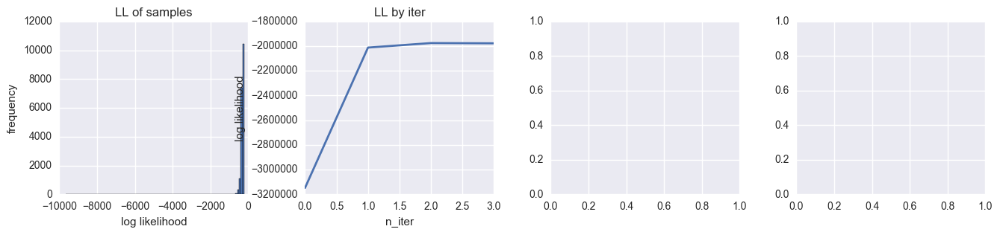

In [10]:
display_pca_data(n_components, decomp, BES_std)

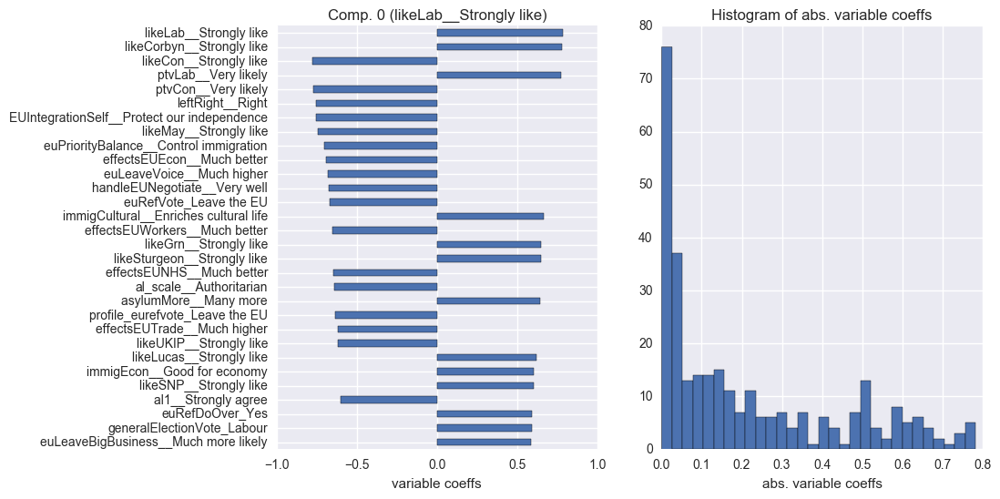

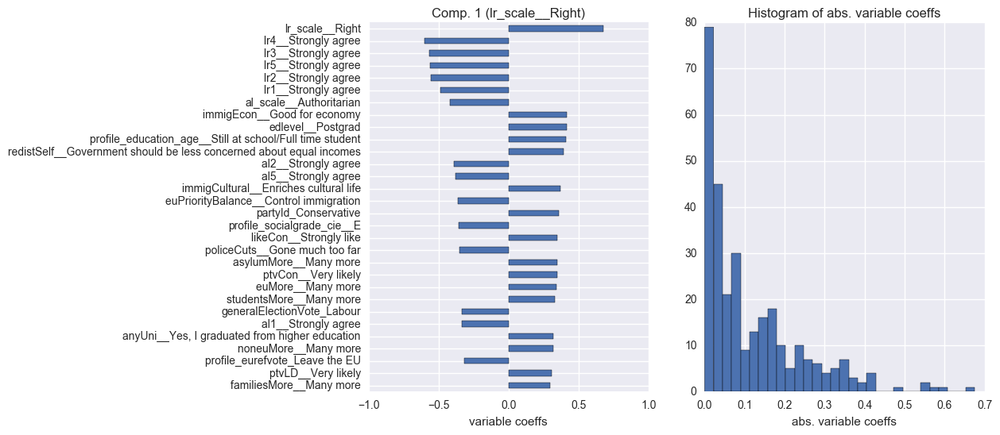

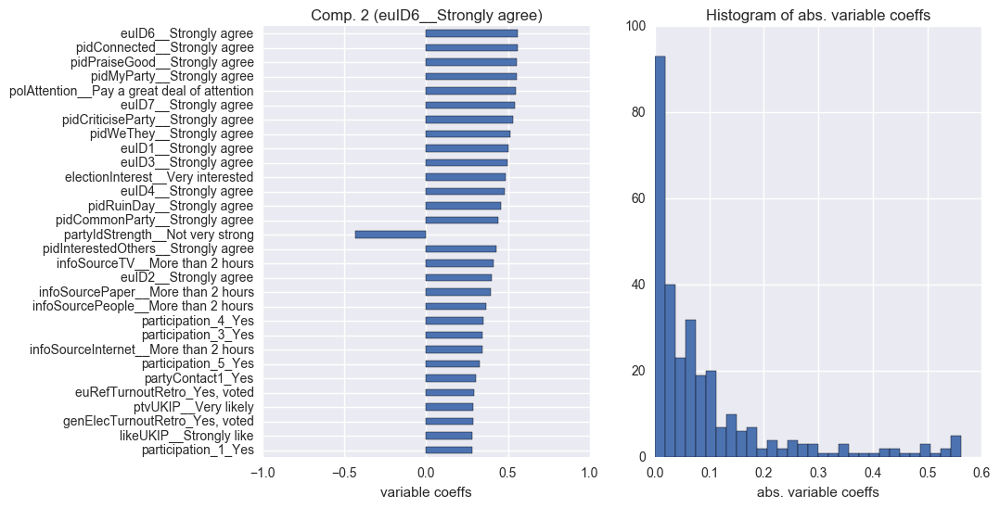

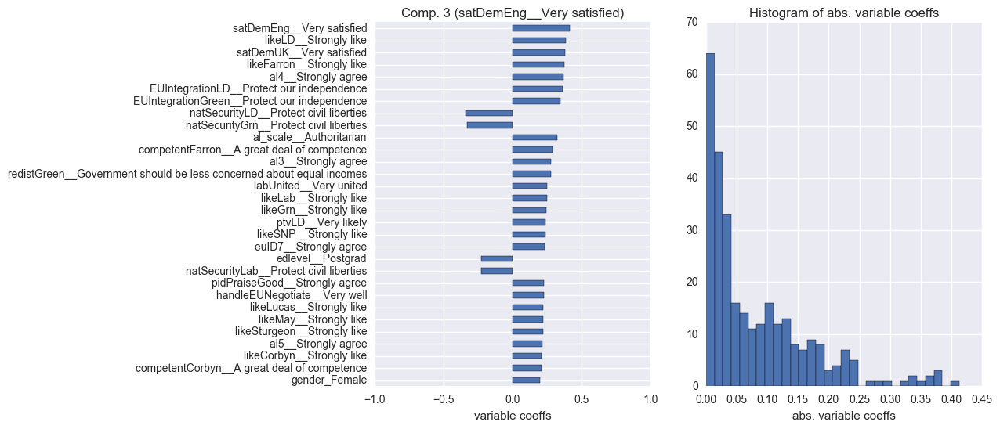

In [11]:
(BES_decomp, comp_labels, comp_dict) = display_components(n_components, decomp,
                                                          BES_reduced.columns, BES_decomp,
                                                          save_folder = False, 
                                                          show_first_x_comps= 4, show_histogram = True)

In [12]:
x_axis = 0
y_axis = 1

xlim = np.floor( BES_decomp.loc[ :, x_axis ].min() ), np.ceil( BES_decomp.loc[ :, x_axis ].max() )
ylim = np.floor( BES_decomp.loc[ :, y_axis ].min() ), np.ceil( BES_decomp.loc[ :, y_axis ].max() )

# SparsePCA
if decomp_method == 'SparsePCA':
    xlim =  BES_decomp.loc[ :, x_axis ].min() ,  BES_decomp.loc[ :, x_axis ].max() 
    ylim =  BES_decomp.loc[ :, y_axis ].min() ,  BES_decomp.loc[ :, y_axis ].max() 

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.datasets as data
%matplotlib inline
sns.set_context('poster')
sns.set_style('white')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.5, 's' : 80, 'linewidths':0}

In [14]:
# moons, _ = data.make_moons(n_samples=50, noise=0.05)
# blobs, _ = data.make_blobs(n_samples=50, centers=[(-0.75,2.25), (1.0, 2.0)], cluster_std=0.25)
# test_data = np.vstack([moons, blobs])
# plt.scatter(test_data.T[0], test_data.T[1], color='b', **plot_kwds)

In [14]:
import hdbscan

In [25]:
X_r[:,0]

array([-0.44100452,  0.48041949, -0.97684269, ...,  1.67461566,
       -0.67870444,  0.26344617])

Wall time: 17.2 s


In [51]:
# clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
#                                       edge_alpha=0.6,
#                                       node_size=80,
#                                       edge_linewidth=2)

In [60]:
gc.collect()

0

num_clusters =49


IndexError: list index out of range

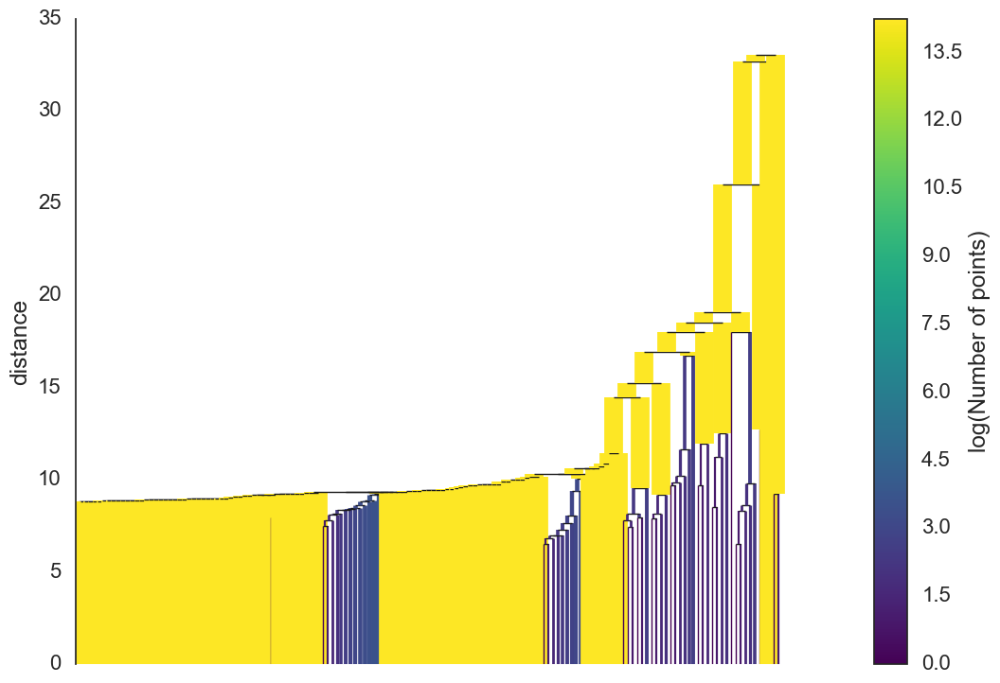

In [71]:
%%time
clusterer = hdbscan.HDBSCAN(min_cluster_size=10, min_samples=1, cluster_selection_method='leaf', alpha=1.3)
clusterer.fit(X_r)
clusterer.single_linkage_tree_.plot(truncate_mode='level', p = 100, cmap='viridis', colorbar=True)

print("num_clusters =" + str( clusterer.labels_.max() ) ) 

color_palette = sns.color_palette('Paired', 12)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in clusterer.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, clusterer.probabilities_)]


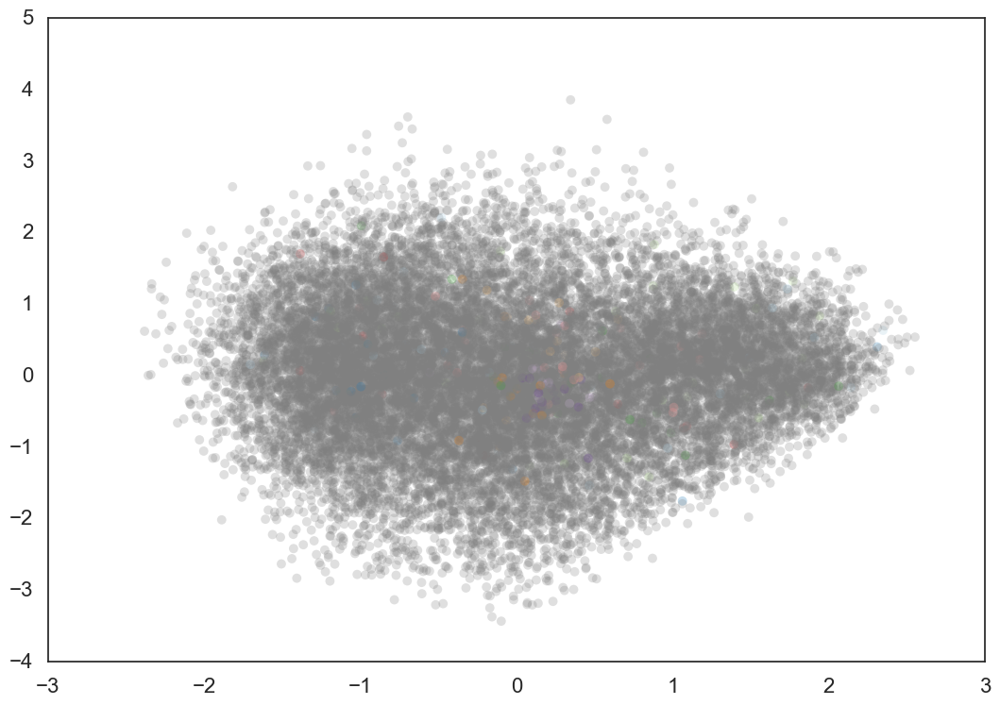

In [72]:
plt.scatter(X_r[:,0], X_r[:,1], s=50, linewidth=0, c=cluster_member_colors, alpha=0.25)


In [45]:
## try different clustering algorithms

params =       {'quantile': .3,
                'eps': .3,
                'damping': .9,
                'preference': -200,
                'n_neighbors': 10,
                'n_clusters': 7}

In [19]:
%%time
X = X_r[:,0:10]

# estimate bandwidth for mean shift
bandwidth = cluster.estimate_bandwidth(X, quantile=params['quantile'])

# connectivity matrix for structured Ward
connectivity = kneighbors_graph(
    X, n_neighbors=params['n_neighbors'], include_self=False)
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)

Wall time: 1min


In [39]:
# ============
# Create cluster objects
# ============
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
two_means = cluster.MiniBatchKMeans(n_clusters=params['n_clusters'])
ward = cluster.AgglomerativeClustering(
    n_clusters=params['n_clusters'], linkage='ward',
    connectivity=connectivity)
spectral = cluster.SpectralClustering(
    n_clusters=params['n_clusters'], eigen_solver='arpack',
    affinity="nearest_neighbors")
dbscan = cluster.DBSCAN(eps=params['eps'])
affinity_propagation = cluster.AffinityPropagation(
    damping=params['damping'], preference=params['preference'])
average_linkage = cluster.AgglomerativeClustering(
    linkage="average", affinity="cityblock",
    n_clusters=params['n_clusters'], connectivity=connectivity)
birch = cluster.Birch(n_clusters=params['n_clusters'])
gmm = mixture.GaussianMixture(
    n_components=params['n_clusters'], covariance_type='full')

clustering_algorithms = (
    ('MiniBatchKMeans', two_means),
#     ('AffinityPropagation', affinity_propagation),
    ('MeanShift', ms),
#     ('SpectralClustering', spectral),
    ('Ward', ward),
    ('AgglomerativeClustering', average_linkage),
    ('DBSCAN', dbscan),
    ('Birch', birch),
    ('GaussianMixture', gmm)
)

MiniBatchKMeans
MeanShift
Ward
AgglomerativeClustering
DBSCAN
Birch
GaussianMixture


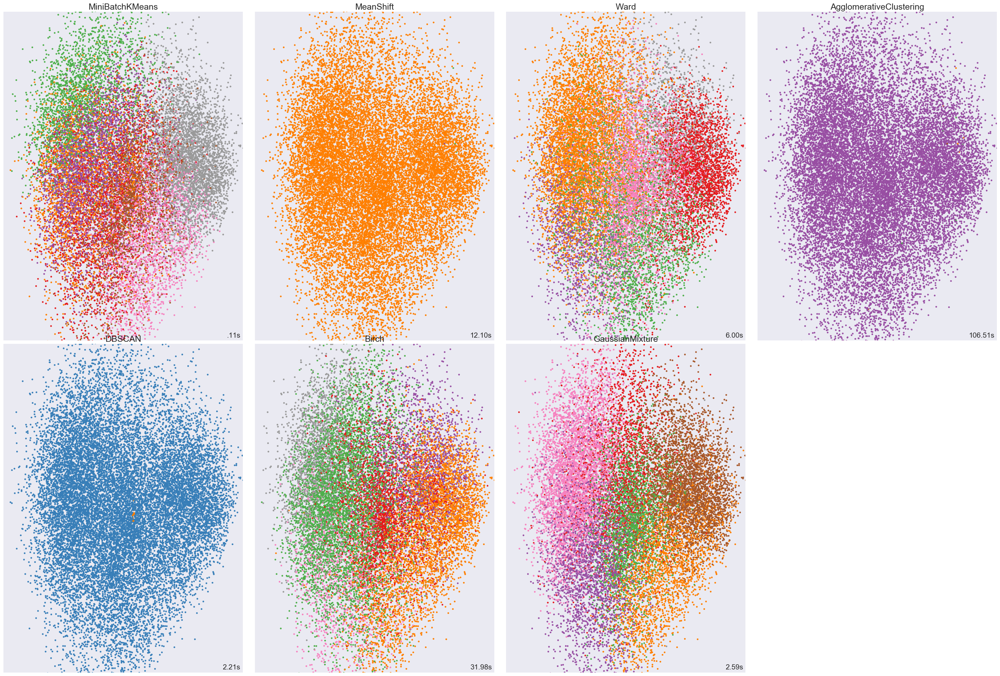

In [40]:
plot_num = 1

plt.figure(figsize=(30, 20))
plt.subplots_adjust(left=.02, right=.98, bottom=.001, top=.96, wspace=.05,
                    hspace=.01)

for name, algorithm in clustering_algorithms:
    print(name)
    t0 = time.time()

    # catch warnings related to kneighbors_graph
    with warnings.catch_warnings():
        warnings.filterwarnings(
            "ignore",
            message="the number of connected components of the " +
            "connectivity matrix is [0-9]{1,2}" +
            " > 1. Completing it to avoid stopping the tree early.",
            category=UserWarning)
        warnings.filterwarnings(
            "ignore",
            message="Graph is not fully connected, spectral embedding" +
            " may not work as expected.",
            category=UserWarning)
        algorithm.fit(X)

    t1 = time.time()
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(X)

    plt.subplot(2, np.ceil(len(clustering_algorithms)/2), plot_num)
    plt.title(name, size=30)

    colors = np.array(list(islice(cycle(['#377eb8', '#ff7f00', '#4daf4a',
                                         '#f781bf', '#a65628', '#984ea3',
                                         '#999999', '#e41a1c', '#dede00']),
                                  int(max(y_pred) + 1 +1))))
    plt.scatter(X[:, 0], X[:, 1], s=10, color=colors[y_pred+1])

    plt.xlim(-2.5, 2.5)
    plt.ylim(-2.5, 2.5)
    plt.xticks(())
    plt.yticks(())
    plt.text(.99, .01, ('%.2fs' % (t1 - t0)).lstrip('0'),
             transform=plt.gca().transAxes, size=15,
             horizontalalignment='right')
    plot_num += 1

plt.show()

In [41]:
gc.collect()

21499

In [21]:
# nbCluster -> ran out of memory!

# pd.DataFrame(X).to_stata(BES_data_folder+"W13_clusterdata_10comp.dta")

#

C:\ANACON~1\envs\BES_analysis\lib\site-packages\pandas\io\stata.py:2001: InvalidColumnName: 
Not all pandas column names were valid Stata variable names.
The following replacements have been made:

    0   ->   _0
    1   ->   _1
    2   ->   _2
    3   ->   _3
    4   ->   _4
    5   ->   _5
    6   ->   _6
    7   ->   _7
    8   ->   _8
    9   ->   _9

If this is not what you expect, please make sure you have Stata-compliant
column names in your DataFrame (strings only, max 32 characters, only
alphanumerics and underscores, no Stata reserved words)

  warnings.warn(ws, InvalidColumnName)


In [29]:
params =       {'quantile': .3,
                'eps': .3,
                'damping': .9,
                'preference': -200,
                'n_neighbors': 10,
                'n_clusters': 7}

Wall time: 295 ms


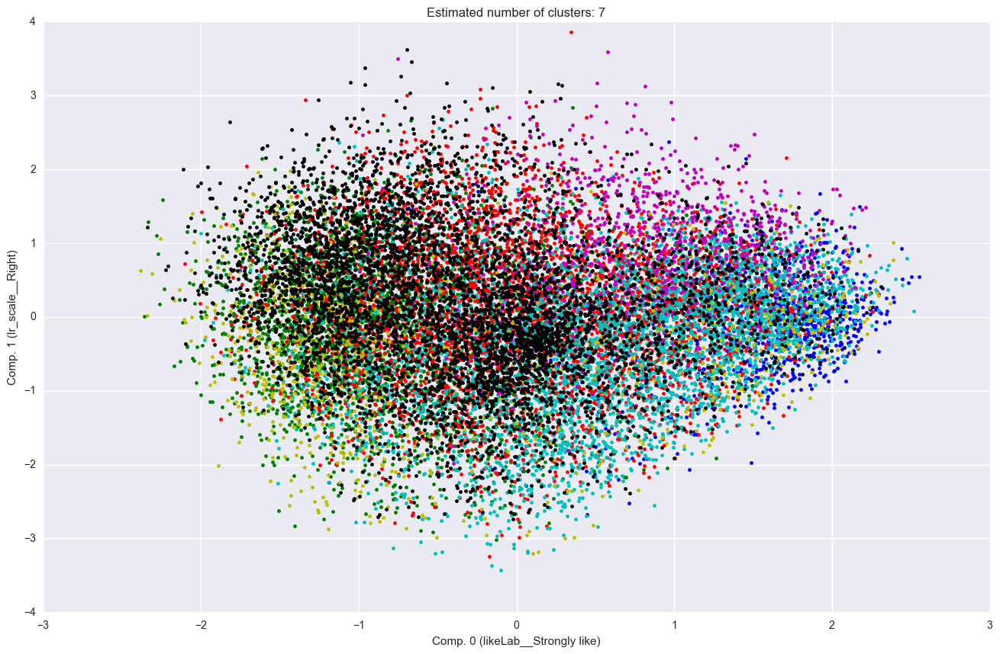

In [46]:
%%time

X = X_r

algorithm = cluster.MiniBatchKMeans(n_clusters=7)
# algorithm = cluster.DBSCAN(eps=.7)
# algorithm = mixture.GaussianMixture(
#     n_components=params['n_clusters'], covariance_type='full')
# algorithm = cluster.Birch(n_clusters=params['n_clusters'])
algorithm.fit(X)

if hasattr(algorithm, 'labels_'):
    y_pred = algorithm.labels_.astype(np.int)
else:
    y_pred = algorithm.predict(X)


labels = y_pred
# cluster_centers = two_means.cluster_centers_



labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

fig = plt.figure( figsize=(16,10) )
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
#     cluster_center = cluster_centers[k]
    plt.plot(X[my_members, x_axis], X[my_members, y_axis], col + '.')
#     plt.plot(cluster_center[x_axis], cluster_center[y_axis], 'o', markerfacecolor=col,
#              markeredgecolor='k', markersize=14)
    
plt.xlim(xlim)
plt.ylim(ylim)
    
plt.xlabel( comp_labels[x_axis] )
plt.ylabel( comp_labels[y_axis] ) 
plt.title('Estimated number of clusters: %d' % n_clusters_)

In [16]:
(labels==-1).all()

True

In [47]:
two_means

DBSCAN(algorithm='auto', eps=0.1, leaf_size=30, metric='euclidean',
    min_samples=5, n_jobs=1, p=None)

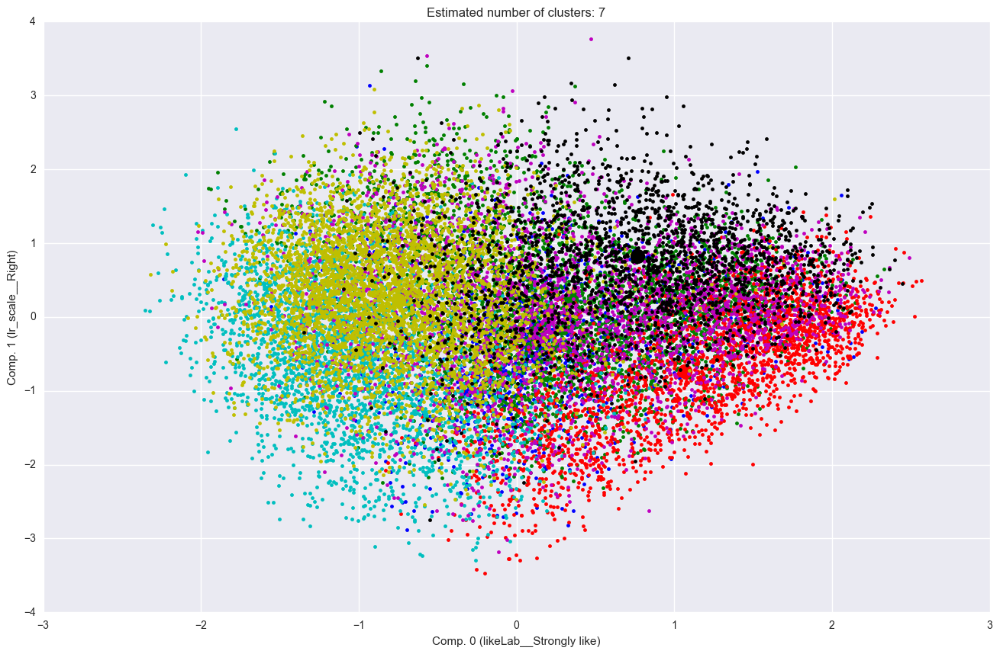

In [17]:
from sklearn import cluster
X = X_r[:,0:20]

two_means = cluster.MiniBatchKMeans(n_clusters=7)

two_means.fit(X)

labels = two_means.labels_
cluster_centers = two_means.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

fig = plt.figure( figsize=(16,10) )
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(X[my_members, x_axis], X[my_members, y_axis], col + '.')
    plt.plot(cluster_center[x_axis], cluster_center[y_axis], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    
plt.xlim(xlim)
plt.ylim(ylim)
    
plt.xlabel( comp_labels[x_axis] )
plt.ylabel( comp_labels[y_axis] ) 
plt.title('Estimated number of clusters: %d' % n_clusters_)

In [ ]:

X = X_r[:,0:20]

two_means = cluster.MiniBatchKMeans(n_clusters=7)
two_means.fit(X)

labels = two_means.labels_
cluster_centers = two_means.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)


# # do the clustering
# k_means = cluster.KMeans(n_clusters=3)
# k_means.fit(X) 
# labels = k_means.labels_

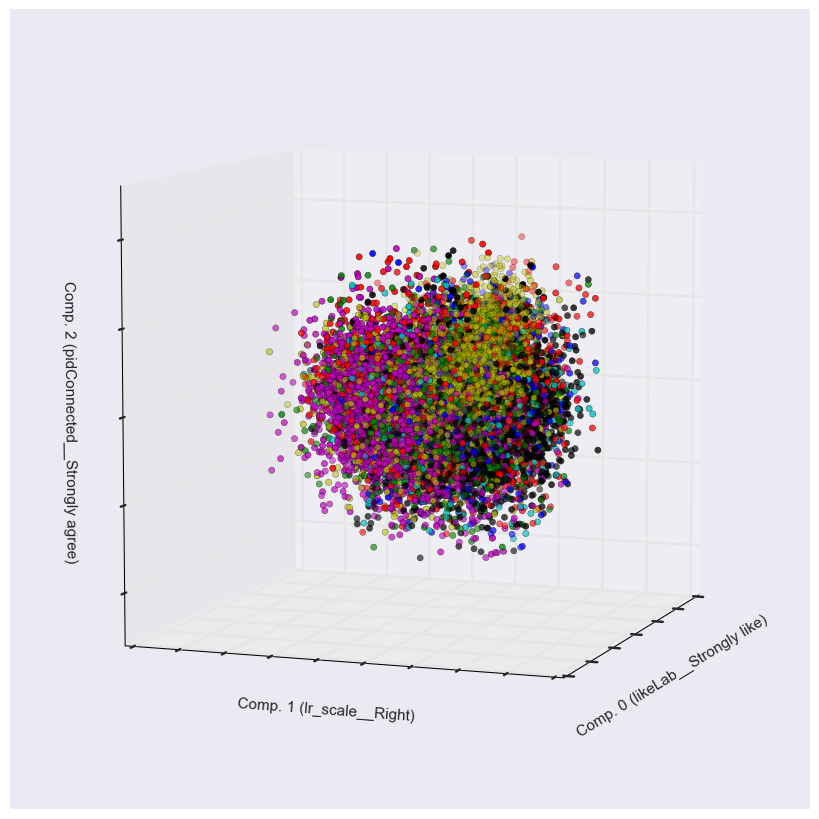

In [19]:
# plot the clusters in color
fig = plt.figure(1, figsize=(8, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, 1, 1], elev=8, azim=200)
plt.cla()

colors = 'bgrcmyk'


ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=[colors[x] for x in labels])

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
ax.set_xlabel(comp_labels[0])
ax.set_ylabel(comp_labels[1])
ax.set_zlabel(comp_labels[2])

plt.show()

In [19]:
import plotly.plotly as py
import plotly.graph_objs as go

import numpy as np

# X[:, 0], X[:, 1], X[:, 2]
# x2, y2, z2 = np.random.multivariate_normal(np.array([0,0,0]), np.eye(3), 200).transpose()
trace2 = go.Scatter3d(
    x=X[:, 0],
    y=X[:, 1],
    z=X[:, 2],
    mode='markers',
    marker=dict(
        size=2,
#         color=[colors[x] for x in labels],                # set color to an array/list of desired values
        color = labels,
#         autocolorscale = True,
        colorscale='Viridis',   # choose a colorscale
#         showscale = True,
        opacity=0.8
    )
)
data = [trace2]
layout = go.Layout(
    scene = dict(
        xaxis = dict(
            title = comp_labels[0]),
        yaxis = dict(
            title = comp_labels[1]),
        zaxis = dict(
            title = comp_labels[2]),),  
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='simple-3d-scatter')




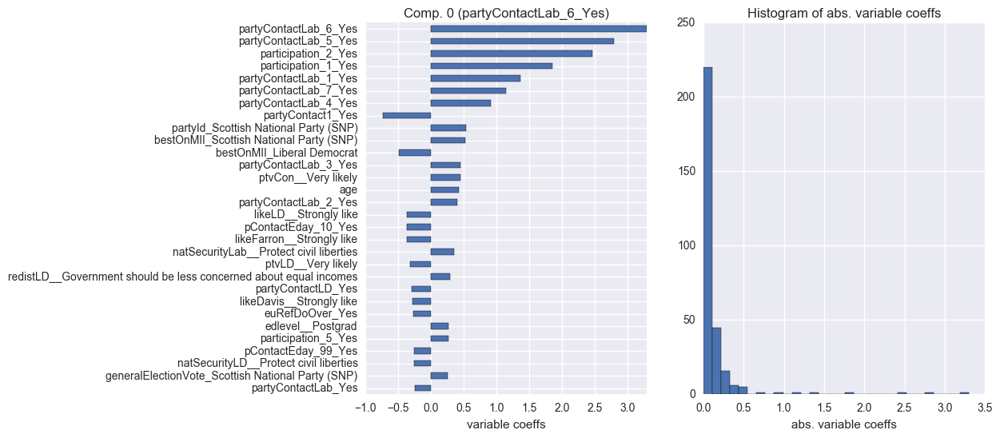

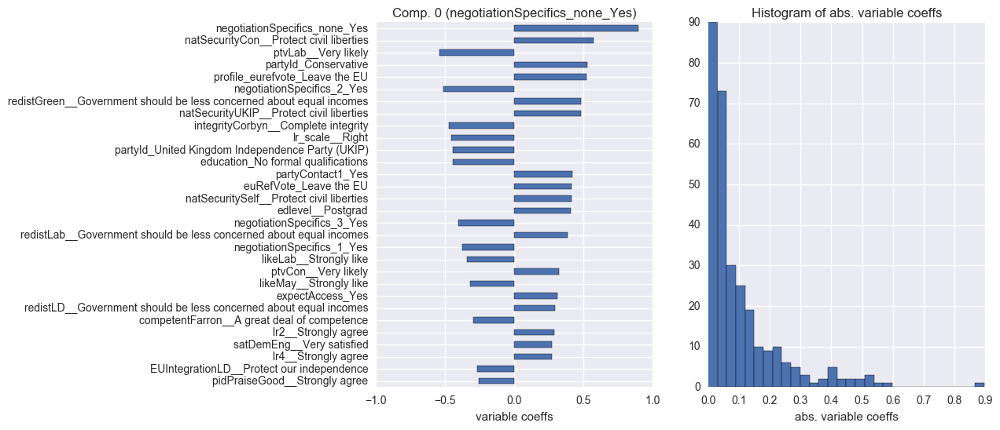

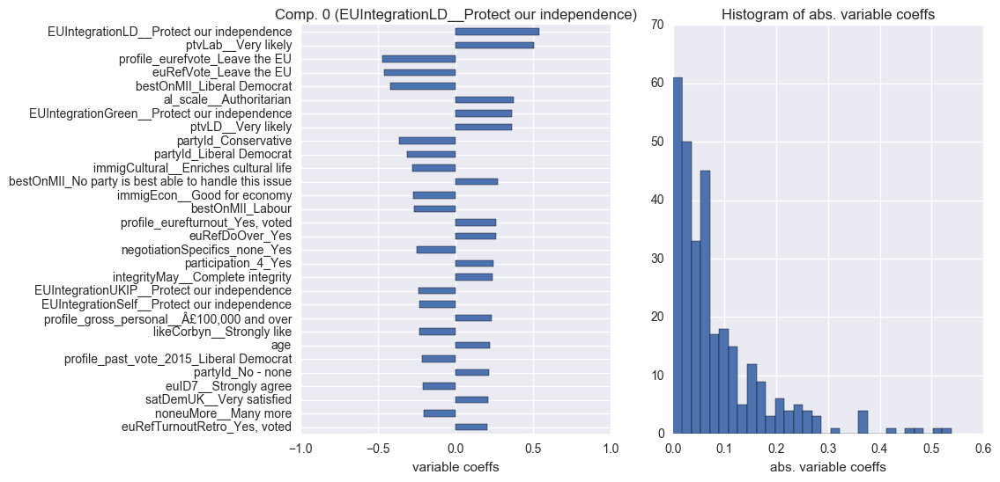

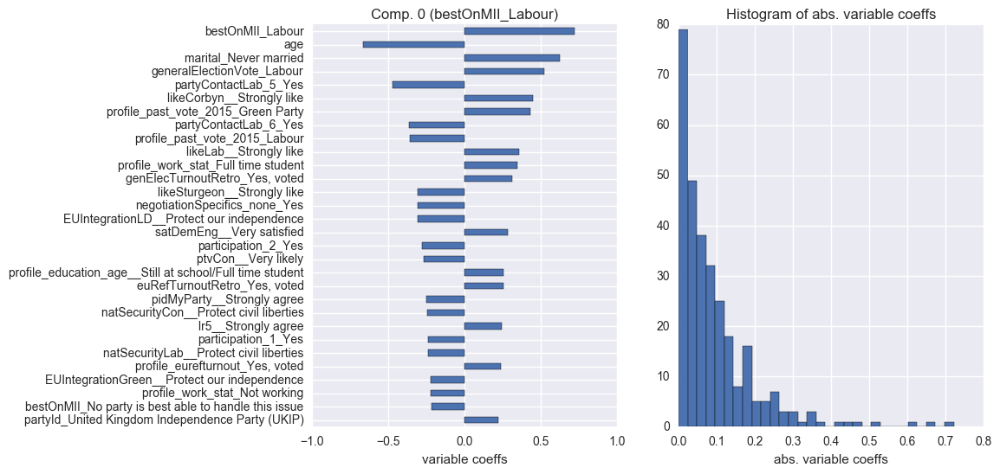

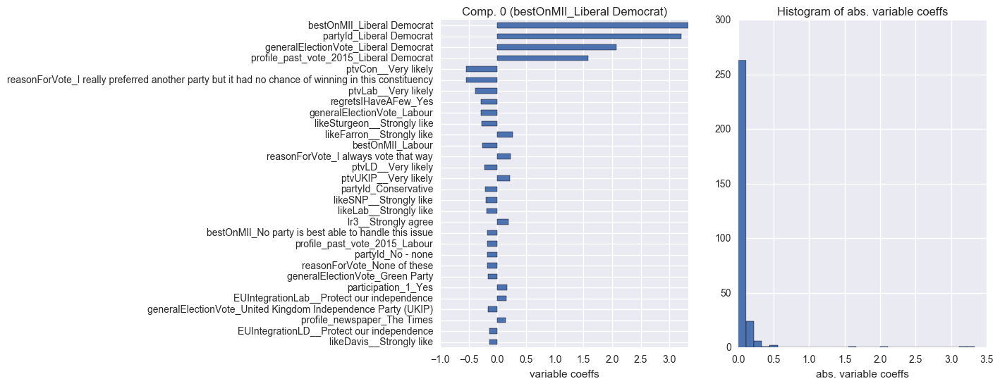

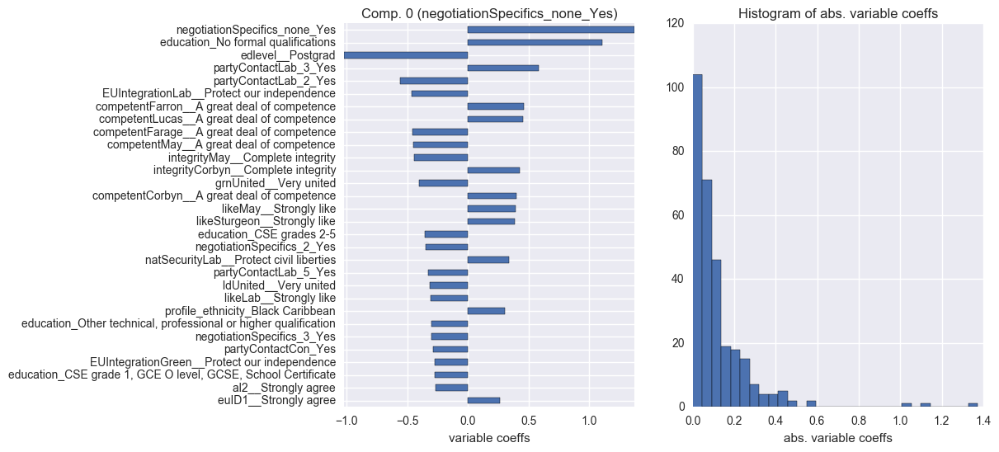

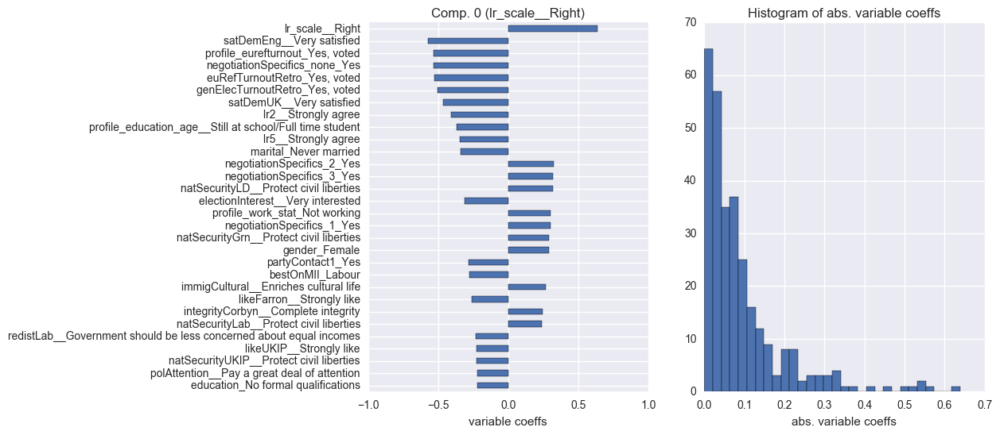

In [47]:
treatdir = BES_data_folder+"W13_clustering"
if not os.path.exists(treatdir): os.makedirs(treatdir)
for cluster_no in range(0,7):

    lda =LinearDiscriminantAnalysis(n_components=1, shrinkage='auto', solver='eigen')
    X_r2 = lda.fit(BES_std, labels==cluster_no).transform(BES_std)
#     lda.coef_ = -lda.coef_ # to get them in the same orientation as pca components!

    decomp = lda
    n_components = lda.n_components
    BES_decomp = pd.DataFrame(   X_r2,
                                 columns = range(0 , n_components),
                                 index   = BES_std.index)
    decomp_var_names = BES_std.columns



    cluster_subdir = treatdir + os.sep + str(cluster_no)
    if not os.path.exists(cluster_subdir): os.makedirs(cluster_subdir)

    (BES_decomp, cluster_comp_labels, cluster_comp_dict) = display_components(n_components, decomp,
                                                              cols = decomp_var_names, BES_decomp = BES_decomp,
                                                              save_folder = cluster_subdir, 
                                                              show_first_x_comps= 4, show_histogram = True,
                                                              flip_axes = False)

In [21]:
pd.DataFrame(labels)[0].value_counts()

1    4203
6    3847
2    3824
4    2557
3    2383
5    1332
0    1267
Name: 0, dtype: int64

number of estimated clusters : 3
Wall time: 1min 9s


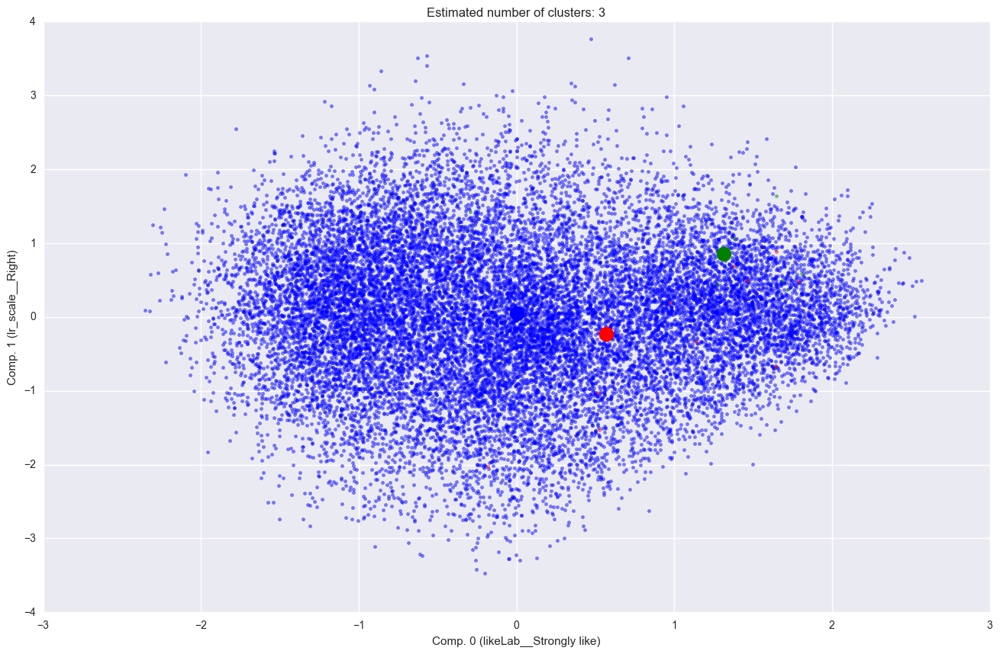

In [22]:
%%time
import numpy as np
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.datasets.samples_generator import make_blobs

X = X_r[:,0:20]

# The following bandwidth can be automatically detected using
# bandwidth = estimate_bandwidth(X, quantile=0.2, n_samples=500)
bandwidth = cluster.estimate_bandwidth(X, quantile=.3)


ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)


fig = plt.figure( figsize=(16,10) )
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(X[my_members, x_axis], X[my_members, y_axis], col + '.',alpha=.5)
    plt.plot(cluster_center[x_axis], cluster_center[y_axis], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    
plt.xlim(xlim)
plt.ylim(ylim)
    
plt.xlabel( comp_labels[x_axis] )
plt.ylabel( comp_labels[y_axis] ) 
plt.title('Estimated number of clusters: %d' % n_clusters_)
# plt.show()

# fig.savefig(BES_data_folder+Treatment+ os.sep +decomp_method+ os.sep +"Cluster_estimation.png",bbox_inches='tight')
